# Helper functions

We generate a random graph as follows:
0. Input: $n$ = number of vertices, $p$ = graph density, $\epsilon$ = minimum distance between edges/vertices
  - Note: Here I define distance to be between the edges' continuation as _lines_
1. Generate $n$ vertices randomly initialized from a unit cube $(0, 0, 0)$ to $(1, 1, 1)$.
  - Has the option of generating a tree-like graph to simulate rigid bodies
2. For each pair of vertices, randomly include that edge with probability $p$.
  - In the tree case, new edges are _in addition_ to the tree
  - Check for continuity and that there exists a pair of non-intersecting edges
3. Check the conditions
$$d^* := \min_{e_1,e_2} d(e_1,d_2) \ge \epsilon$$
$$d_* := \min_{v_1,v_2} d(v_1,v_2) \ge \epsilon$$
4. Optimize the vertex position to increase $\min(d^*, d_*)$ each time using a Pytorch optimizer (in this case SGD).
5. Optionally stop as soon as $\min(d^*, d_*)$ exceeds $\epsilon$.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import torch

from sklearn.preprocessing import normalize
from scipy.spatial import Delaunay
import triangle as tr
from scipy.linalg import expm, norm

from tqdm import tqdm
from collections import defaultdict

In [2]:
import pyvista as pv
import open3d as o3d
import trimesh

from trimesh.curvature import discrete_mean_curvature_measure, sphere_ball_intersection

In [3]:
import pickle
import os

In [4]:
def initialize_random_graph(n, p, tree=False):
  '''
  Initializes an (n, p) random graph with random positions in a unit cube
  Must be connected and have a nonzero number of non-intersecting edges
  '''
  if n < 4 or p <= 0:
    return None, None

  edge_pairs = []

  # Keep looping until we have non overlapping edges
  while len(edge_pairs) == 0:
    if tree:
        G = nx.generators.trees.random_tree(n)

        positions_vector = np.random.rand(n, 3)
        positions = {i: positions_vector[i,:] for i in range(n)}
        nx.set_node_attributes(G, positions, 'pos')

        for i in range(n-1):
          for j in range(i+1, n):
            if not G.has_edge(i, j) and np.random.rand() < p:
              G.add_edge(i, j)
    else:
        G = nx.soft_random_geometric_graph(n, np.inf, dim=3, p_dist=lambda d: p)

    positions = nx.get_node_attributes(G, 'pos')
    vertices = np.asarray([positions[i] for i in range(n)])

    edges = np.asarray(G.edges())

    if nx.is_connected(G):
      edge_pairs = get_edge_pairs(edges)

  return vertices, edges

In [5]:
def get_edge_pairs(edges):
  '''
  Params
    edges: an mx2 tensor
  Returns
    edge_pairs: a px2x2 tensor, where p is the number of pairs of edges
  '''
  result = []
  for i in range(edges.shape[0]-1):
    for j in range(i+1, edges.shape[0]):
      if len({edges[i,0], edges[i,1], edges[j,0], edges[j,1]}) == 4:
        result.append([[edges[i,0], edges[i,1]], [edges[j,0], edges[j,1]]])
  return np.asarray(result)

def get_min_dist(vertices, edge_pairs):
  '''
  vertices: nx3 tensor
  edges: px2x2 tensor

  Returns min(min(dist(e1, e2)), min(dist(v1, v2)))
  '''
  clamped_vertices = torch.clamp(vertices, min=0, max=1)

  # Calculate min dist between vertices

  diff = clamped_vertices[:,None,:] - clamped_vertices[None,:,:]
  dist = torch.flatten((diff * diff).sum(dim=2))
  node_dist = torch.min(dist[torch.nonzero(dist)])[None]

  # Calculate min dist between edges
  # Assume no 2 lines are parallel (general position)
  edge_pairs_pos = clamped_vertices[edge_pairs]

  dir = edge_pairs_pos[:,:,1,:] - edge_pairs_pos[:,:,0,:]
  src = edge_pairs_pos[:,:,0,:]
  nm = torch.cross(dir[:,0,:], dir[:,1,:], dim=1)
  r = src[:,0,:] - src[:,1,:]
  edge_dist = torch.abs((nm*r).sum(dim=1)) / torch.sqrt((nm*nm).sum(dim=1))

  return torch.min(torch.cat((node_dist, edge_dist), dim=0))

In [6]:
# From stack overflow
# https://stackoverflow.com/questions/75101952/minimizing-a-function-using-pytorch-optimizer-return-values-are-all-the-same
def minimize(function, initial_parameters, lr=0.01, num_iter=10, threshold=None, verbose=False):
    '''
    Minimizes a given function, optionally stops as soon as it reaches a given threshold
    '''
    list_params = []
    params = initial_parameters
    params.requires_grad_()
    optimizer = torch.optim.SGD([params], lr=lr)

    for i in tqdm(range(num_iter)):
        optimizer.zero_grad()
        loss = function(params)
        if threshold is not None and loss < threshold:
          print(f'Reached threshold at iteration {i}')
          break
        loss.backward()
        optimizer.step()
        if verbose:
          print(f'Iteration {i}')
          print(params)
          print(loss)
          if len(list_params) > 0:
            print(f'Points changed: {np.count_nonzero(np.linalg.norm(params.detach().clone() - list_params[-1], axis=1))}')
        list_params.append(params.detach().clone()) #here

    return params, list_params

In [7]:
def optimize_random_graph(vertices, edges, lr=0.01, num_iter=10, threshold=None, verbose=False):
  '''
  Optimizes the vertex positions until the graph's min dist between edges exceeds a certain threshold
  '''
  edge_pairs = torch.tensor(get_edge_pairs(edges))
    
  vertices = torch.tensor(vertices)

  print(f'Initial min dist: {get_min_dist(vertices, edge_pairs)}')

  if len(edge_pairs) == 0:
    print("No non-intersecting edges found")
    return None

  final_vertices, _ = minimize(lambda v: -get_min_dist(v, edge_pairs), vertices, lr=lr, num_iter=num_iter, threshold = -threshold if threshold is not None else None, verbose=verbose)
  final_vertices = torch.clamp(final_vertices, min=0, max=1)

  print(f'Final min dist: {get_min_dist(final_vertices, edge_pairs)}')

  return final_vertices.detach().clone().numpy()

In [8]:
def visualize(vertices, edges):
  '''
  Generates a 3D plot of the vertices and the edges
  '''
  node_xyz = vertices
  edge_xyz = np.array([(node_xyz[u], node_xyz[v]) for u, v in edges])

  fig = plt.figure()
  ax = fig.add_subplot(111, projection="3d")

  # Plot the nodes - alpha is scaled by "depth" automatically
  ax.scatter(*node_xyz.T, s=100, ec="w")

  # Plot the edges
  for edge in edge_xyz:
      ax.plot(*edge.T, color="tab:gray")
  plt.show()

# Results of running the code

### Random graph

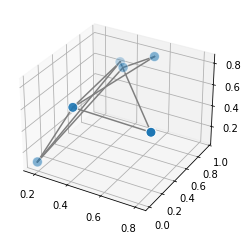

array([[0.1769261 , 0.0395664 , 0.08127695],
       [0.81369204, 0.13635597, 0.6099739 ],
       [0.4149398 , 0.01553395, 0.71509875],
       [0.40815451, 0.77547575, 0.6951183 ],
       [0.31979181, 0.95593996, 0.62490877],
       [0.56945019, 0.84721317, 0.82788532]])

In [9]:
n = 6
p = 0.5
eps = 0.2

initial_vertices, edges = initialize_random_graph(n, p)
visualize(initial_vertices, edges)
initial_vertices

Initial min dist: 0.00398788943861247


 18%|██████████████                                                               | 182/1000 [00:00<00:00, 977.46it/s]


Reached threshold at iteration 182
Final min dist: 0.2056886176310187


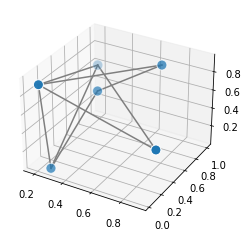

array([[0.28629077, 0.02087132, 0.05291749],
       [0.91349533, 0.23201207, 0.4286503 ],
       [0.21504386, 0.02804735, 0.91950302],
       [0.38944321, 0.52554693, 0.64710813],
       [0.1764694 , 1.        , 0.58265654],
       [0.72221188, 0.78671494, 0.92342651]])

In [10]:
final_vertices = optimize_random_graph(initial_vertices, edges, lr=0.01, num_iter=1000, threshold=eps, verbose=False)
visualize(final_vertices, edges)
final_vertices

### Random tree

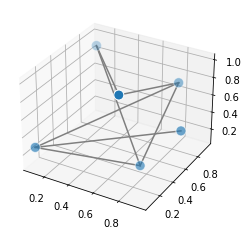

array([[0.76537821, 0.95254161, 0.68762441],
       [0.74400198, 0.40950124, 0.09106469],
       [0.09083943, 0.05808822, 0.27364938],
       [0.94744602, 0.63482959, 0.42016805],
       [0.08918684, 0.93683242, 0.87560506],
       [0.68208208, 0.20909779, 0.99902187]])

In [39]:
n = 6
p = 0.1
eps = 0.5

initial_vertices, edges = initialize_random_graph(n, p, tree=True)
visualize(initial_vertices, edges)
initial_vertices

Initial min dist: 0.10352345170130181


 26%|███████████████████▌                                                        | 258/1000 [00:00<00:00, 1316.53it/s]

Reached threshold at iteration 258
Final min dist: 0.504117905857594


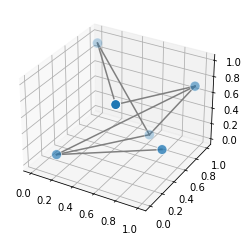

array([[0.97706266, 0.92374178, 0.73873088],
       [0.58776255, 0.87003172, 0.        ],
       [0.20793224, 0.        , 0.20269279],
       [1.        , 0.31871735, 0.36572015],
       [0.        , 1.        , 0.89482981],
       [0.74006203, 0.03555871, 1.        ]])

In [40]:
final_vertices = optimize_random_graph(initial_vertices, edges, lr=0.01, num_iter=1000, threshold=eps, verbose=False)
visualize(final_vertices, edges)
final_vertices

### Write the graph to an available file

In [41]:
final_graph = final_vertices, edges

# WRITE_NUM = 1

for i in range(1, 101):
    path = f'graph{i}.pickle'
    if path not in os.listdir('.'):
        WRITE_NUM = i
        break

write_graph_path = f'graph{WRITE_NUM}.pickle'
print(write_graph_path)

with open(write_graph_path, 'wb') as f:
    pickle.dump(final_graph, f)

graph18.pickle


# Adding Faces

0. Take the final vertices and edges from the random graph generator
1. Identify the cycles of the graph.
2. For each cycle, add a face with probability $q$.
3. Generate the minimal surface of each added face.
4. Generate the mesh for each minimal surface.

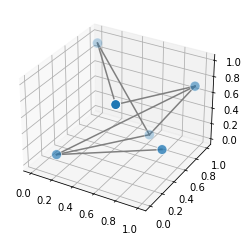

In [42]:
READ_NUM = WRITE_NUM

with open(f'graph{READ_NUM}.pickle', 'rb') as f:
    vertices, edges = pickle.load(f)

visualize(vertices, edges)

In [43]:
# Load graph object from before

def graph_from_positions(final_vertices, edges):
  G = nx.Graph()
  G.add_nodes_from(np.arange(0, len(final_vertices)))

  positions = {i: final_vertices[i,:] for i in range(n)}
  nx.set_node_attributes(G, positions, 'pos')
  G.add_edges_from(edges)
  return G

In [44]:
def rotation_matrix(axis, theta):
    return expm(np.cross(np.eye(3), axis/norm(axis)*theta))

In [45]:
def o3d_to_trimesh(mesh):
    return trimesh.Trimesh(vertices=np.asarray(mesh.vertices),
                           faces=np.asarray(mesh.triangles))

def to_o3d(vertices, faces):
    mesh_o3d = o3d.geometry.TriangleMesh()
    mesh_o3d.vertices = o3d.utility.Vector3dVector(np.asarray(vertices))
    mesh_o3d.triangles = o3d.utility.Vector3iVector(np.asarray(faces))
    mesh_o3d.orient_triangles()
    mesh_o3d.compute_triangle_normals()
    mesh_o3d.compute_vertex_normals()
    mesh_o3d.normalize_normals()
    return mesh_o3d

def trimesh_to_o3d(mesh):
    return to_o3d(mesh.vertices, mesh.faces)

def display_mesh(mesh):
    mesh_o3d = o3d.geometry.TriangleMesh()
    mesh_o3d.vertices = o3d.utility.Vector3dVector(np.asarray(mesh.vertices))
    mesh_o3d.triangles = o3d.utility.Vector3iVector(np.asarray(mesh.faces))
    mesh_o3d.compute_vertex_normals()
    o3d.visualization.draw_plotly([mesh_o3d])
    
def display_o3d(mesh):
    o3d.visualization.draw_plotly([mesh])
    
def sum_all_o3d(meshes):
    mesh = meshes[0]
    for m in meshes[1:]:
        mesh = mesh + m
    return mesh

In [46]:
def refine_vertices_faces(vertices, faces, num_refinements=1, verbose=False):
    if verbose:
        print(vertices.shape)
        print(faces.shape)
    for _ in range(num_refinements):
        vertices, faces = trimesh.remesh.subdivide(vertices, faces)
    if verbose:
        print(vertices.shape)
        print(faces.shape)
    return trimesh.Trimesh(vertices=np.asarray(vertices),
                               faces=np.asarray(faces))

def refine_mesh_alot(mesh, num_refinements=1):
    return refine_vertices_faces(np.asarray(mesh.vertices), np.asarray(mesh.faces), num_refinements)

In [47]:
# One-ring neighborhood: https://github.com/mikedh/trimesh/issues/52

def get_one_ring(mesh):
    grad_area = []
    g = nx.from_edgelist(mesh.edges_unique)
    one_ring = [list(g[i].keys()) for i in range(len(mesh.vertices))]
    one_ordered = []
    for i in range(len(one_ring)):
        ring = nx.cycle_basis(g.subgraph(one_ring[i]))
        if len(ring) > 0:
            one_ordered.append(ring[0])
        else:
            one_ordered.append(one_ring[i])

    return one_ordered

In [48]:
def cot(v, w):
    if np.linalg.norm(np.cross(v, w)) == 0:
        print(v, w)
    return np.dot(v, w) / np.linalg.norm(np.cross(v, w))

def get_mean_curvature(vertices, one_ring, boundary_points):
    boundary = set(boundary_points)
    result = []
    for j, (p, ring) in enumerate(zip(vertices, one_ring)):
        if len(ring) < 3 or j in boundary:
            result.append(np.array([0., 0., 0.]))
            continue
            
        grad_pa = np.array([0., 0., 0.])
        area = 0
        
#         print(j)
        
        for i in range(len(ring)):
            # Compute gradient of mesh area wrt p for vertex q
            q = vertices[ring[i]]
            
            a = vertices[ring[(i-1) % len(ring)]]
            b = vertices[ring[(i+1) % len(ring)]]
            
            cotalpha = cot(p-a, q-a)
            cotbeta = cot(p-b, q-b)
            
            grad_pa += (cotalpha + cotbeta) * (p - q) / 2
            
            # Compute area of voronoi cell for p, q, a
            cotgamma = cot(p-q, a-q)
            area += (np.sum((p-a)**2) * cotgamma + np.sum((p-q)**2) * cotalpha) / 8
        
        result.append(grad_pa / area)
        
    return np.array(result)

In [49]:
class FacedGraph:
  cylinder_refinement = 20
  initial_min_surface_refinement = 3
  final_min_surface_refinement = 2

  def __init__(self, vertices, edges):
    self.vertices = vertices
    self.edges = edges
    self.G = graph_from_positions(vertices, edges)

  def add_cycles(self, q, max_cycle_length=4):
    '''
    For each cycle in the cycle basis, include it probability q
    '''
    all_cycles = sorted(nx.cycle_basis(self.G))

    self.cycles = set()
    for cycle in all_cycles:
      if np.random.rand() >= q or len(cycle) > max_cycle_length:
        continue

      self.cycles.add(tuple(cycle))
    
    print(f'{len(self.cycles)} total cycles')

  def extrude(self, r=0.01, lr=0.005, num_epochs=100):
    '''
    Compute the minimal surface at each cycle and then extrude
    '''
    # Sphere at each point
    
    self.sphere_meshes = []
    for i in range(self.vertices.shape[0]):
        mesh = o3d.geometry.TriangleMesh.create_sphere(r)
        mesh.vertices = o3d.utility.Vector3dVector(mesh.vertices + self.vertices[i,:])
        self.sphere_meshes.append(mesh)
    
    # Cylinder at each edge
    
    self.cylinder_meshes = []
    for (i, j) in self.edges:
        mesh = o3d.geometry.TriangleMesh.create_cylinder(r, 1, split=FacedGraph.cylinder_refinement)
        
        # Transform each cylinder to be centered around the edge
        direction = self.vertices[j]-self.vertices[i]

        angle = np.arccos(np.dot(np.array([0,0,1]), direction/norm(direction)))
        axis = np.cross(np.array([0,0,1]), direction/norm(direction))
        scale = np.array([1, 1, norm(direction)])
        trans = (self.vertices[j]+self.vertices[i]) / 2

        new_vertices = [trans + rotation_matrix(axis, angle)@(scale*v) for v in mesh.vertices]
        mesh.vertices = o3d.utility.Vector3dVector(new_vertices)

        self.cylinder_meshes.append(mesh)
       
    print('Vertex and edge skeleton')
    display_o3d(sum_all_o3d(self.sphere_meshes + self.cylinder_meshes))
    
    # Minimal surface at each cycle face
    
    self.cycle_meshes = []
    for i, cycle in enumerate(self.cycles):
        n = len(cycle)
        print(f'Extruding cycle {i}, length {n}')
        
        # Refine the cycle mesh a little
        # Refining it too much would screw with the mean curvature algorithm
        points = np.array([self.vertices[i] for i in cycle])
        faces = [[0, i+1, i+2] for i in range(len(cycle) - 2)]
    
        cycle_mesh = refine_vertices_faces(np.asarray(points), np.asarray(faces), FacedGraph.initial_min_surface_refinement)
        
        if n > 3:
            # Get the boundary points
            unique_edges = cycle_mesh.edges[trimesh.grouping.group_rows(cycle_mesh.edges_sorted, require_count=1)]
            boundary_points = sorted(set(unique_edges.flatten()))

            # Run the mean curvature algorithm
            one_ring = get_one_ring(cycle_mesh)
            
            for epoch in tqdm(range(num_epochs)):
                flow = get_mean_curvature(cycle_mesh.vertices, one_ring, boundary_points)
                new_vertices = cycle_mesh.vertices - lr * flow / np.sqrt(epoch+1)
                cycle_mesh.vertices = new_vertices
            
        # Refine the mesh again
        refined_mesh = refine_mesh_alot(cycle_mesh, FacedGraph.final_min_surface_refinement)

        o3d_mesh = trimesh_to_o3d(refined_mesh)
        
        display_o3d(o3d_mesh)
        
        # Extrude along the average face normal of the mesh
        avg_normal = normalize(np.mean(o3d_mesh.triangle_normals, axis=0).reshape(1, -1))[0,:]
        upper_mesh = to_o3d(o3d_mesh.vertices + r*avg_normal, o3d_mesh.triangles)
        lower_mesh = to_o3d(o3d_mesh.vertices - r*avg_normal, o3d_mesh.triangles)
        
        self.cycle_meshes += [upper_mesh, lower_mesh]
        
    self.final_mesh = sum_all_o3d(self.sphere_meshes + self.cylinder_meshes + self.cycle_meshes)
    
    print('Full skeleton')
    display_o3d(self.final_mesh)

In [50]:
full_graph = FacedGraph(final_vertices, edges)
full_graph.add_cycles(1, max_cycle_length=4)
full_graph.extrude(r=0.05, lr=0.002, num_epochs=100)

2 total cycles
Vertex and edge skeleton


Extruding cycle 0, length 3


Extruding cycle 1, length 4


100%|███████████████████████████████████████████████████████████████████████████████| 100/100 [00:09<00:00, 10.29it/s]


Full skeleton


In [51]:
write_mesh_path = f'mesh{READ_NUM}.obj'
print(write_mesh_path)

o3d.io.write_triangle_mesh(write_mesh_path, full_graph.final_mesh)

mesh18.obj


True

# Display some meshes

In [53]:
# Good MS: mesh3.obj
# Good, triangles only: mesh5.obj
# Good MS but possibly self-intersecting: final_mesh.obj
# Good MS but definitely self-intersecting: mesh1.obj
# Explosion (no convergence): mesh4.obj
read_mesh_path = f'mesh3.obj'

display_o3d(o3d.io.read_triangle_mesh(read_mesh_path))

# Next steps

1. Extrude the minimal surface by vertex normal
2. Minimal surface optimization (scale by area, 5-6-cycles)
3. cgal (libigl) for union and remeshing